# Python for Spatial Analysis
## Second part of the module of GG3209 Spatial Analysis with GIS.
### Notebook to practice GeoPandas - Exercises

---
Dr Fernando Benitez -  University of St Andrews - School of Geography and Sustainable Development - First Iteration 2023 v.1.0 

## 3.1 Practicing GeoPandas 

In the folder London Data you will find a shapefile representing the LSOA polygns with the population from the latest census 2021,  **data\london_data\Census2o_LSOA.shp** . For example, the column "Pop20" contains population counts for each LSOA area. For this excersice you need to create and wirte the code for the following challenges.

Read the **Census2o_LSOA.shp** layer into a GeoDataFrame.

- Subset the following columns (plus the geometry!):

    * LSOA11CD --> LSOA area code
    * LSOA11NM --> LSOA area name 
    * LSOA11NMW --> LSOA bigger area
    * Pop20 -->  Population counts

- What is the Coordinate Reference System of the layer? 

- How many features does the layer contain? Write an expression that returns the result as int.

- The values in the "LSOA11CD" column (code area ID) should all be unique. How can you make sure? Either use one of the methods we learned earlier, or search online (e.g., google “pandas check for duplicates”).

- Plot the layer using the .plot method

- Plot the layer using the .explorer method

- Subset just the LSOA areas with Pop20 counts greater than 1500.

- Plot the resulting subset, using symbology according to total population size, i.e., the "Pop_Total" column, and using a sequentual color map such as "Reds".

- How many areas are there with the requested population? (hint: shape)

- What is the total population of the subset layer? (hint: sum)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import contextily as ctx
import rasterio as rio
from rasterio import plot

plt.rcParams['figure.figsize'] = [10, 8]

<AxesSubplot: >

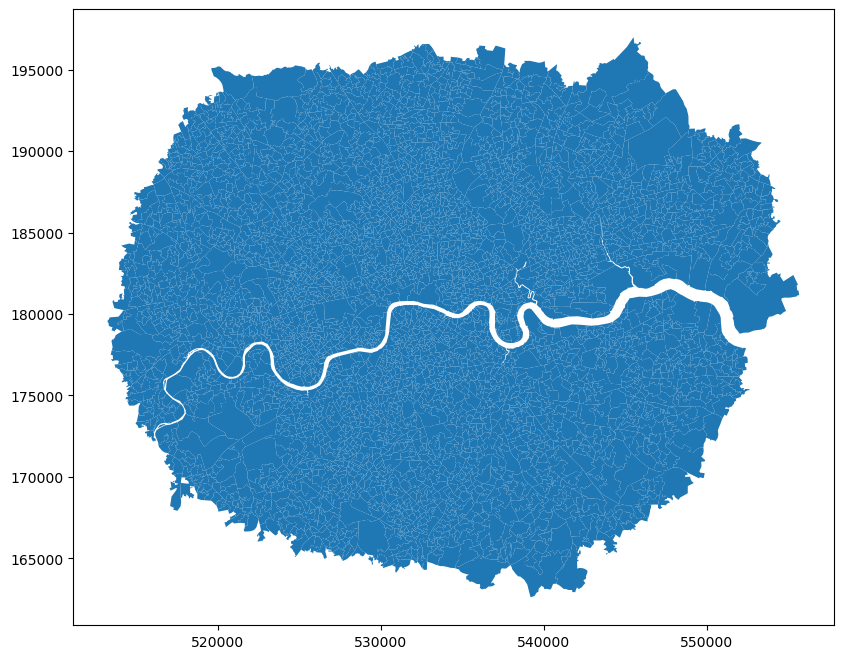

In [5]:
census_file = gpd.read_file('data/london_data/Census2o_LSOA.shp')
census_file.plot()

In [6]:
census_file.head()

,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,GlobalID,MERGE_SRC,Shape_Leng,Shape_Area,LSOA_Code,LSOA_Name,Pop20,ObjectID,geometry
0,E01000001,City of London 001A,City of London 001A,532129,181625,-0.097060,51.51810,133324.978691,2291.187925,e87faa35-c559-4230-93be-8484ab490f70,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2291.187925,133324.978700,E01000001,City of London 001A,1749.0,28010,"POLYGON ((532105.092 182011.230, 532162.491 18..."
1,E01000002,City of London 001B,City of London 001B,532480,181699,-0.091970,51.51868,226210.015953,2488.086900,f0e3338a-e889-49be-8ca4-c7f2de90afd6,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2488.086900,226210.015930,E01000002,City of London 001B,1678.0,28011,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London 001C,532245,182036,-0.095230,51.52176,57285.328705,1142.242230,a3512b47-41ae-4703-8264-c7cc44db1b37,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1142.242230,57285.328700,E01000003,City of London 001C,1900.0,28012,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,City of London 001E,533581,181265,-0.076280,51.51452,190747.438499,2167.872156,b62f5c70-737d-4936-9c85-eef139fce72f,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2167.872156,190747.438514,E01000005,City of London 001E,2181.0,28013,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184276,0.089318,51.53876,144195.364548,1935.412725,f74c0183-63f6-4468-b58d-577339257dea,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1935.412725,144195.364528,E01000006,Barking and Dagenham 016A,2117.0,28016,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [8]:
small_sample = census_file[["LSOA11CD", "LSOA11NM", "LSOA11NMW", "Pop20"]]
small_sample.head()

,LSOA11CD,LSOA11NM,LSOA11NMW,Pop20
0,E01000001,City of London 001A,City of London 001A,1749.0
1,E01000002,City of London 001B,City of London 001B,1678.0
2,E01000003,City of London 001C,City of London 001C,1900.0
3,E01000005,City of London 001E,City of London 001E,2181.0
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,2117.0


In [10]:
census_file.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [11]:
len(small_sample)

3920

In [12]:
boolean = small_sample.duplicated(subset=['LSOA11CD']).any()
print(boolean, end='\n\n') # True

False



<AxesSubplot: >

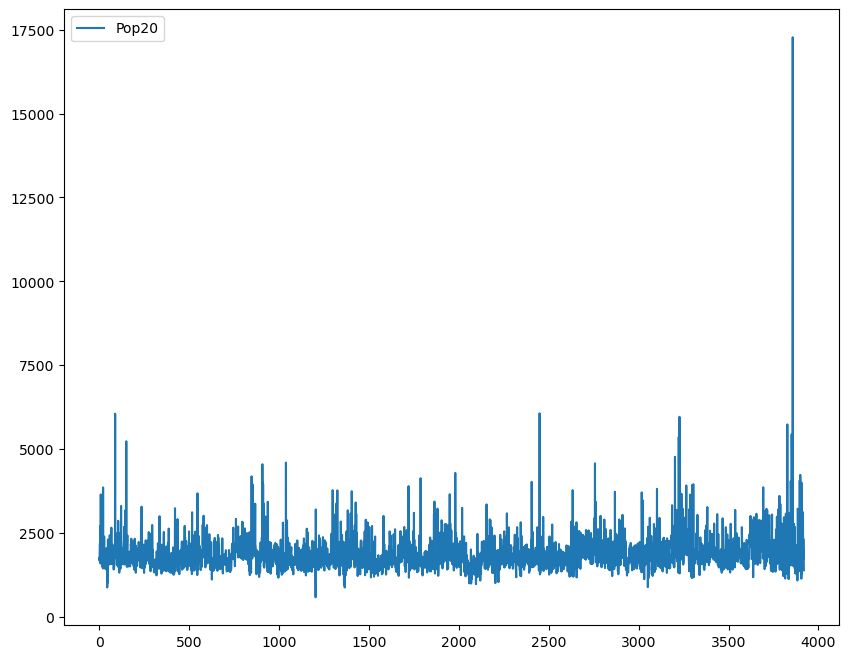

In [14]:
small_sample.plot()

In [20]:
census_file.explore(column = "Pop20", cmap = "RdYlBu")

In [31]:
new_sample = census_file['Pop20'] > 1500
new_sample

0        True
1        True
2        True
3        True
4        True
        ...  
3915     True
3916     True
3917     True
3918     True
3919    False
Name: Pop20, Length: 3920, dtype: bool

In [32]:
new_GDF = census_file[new_sample]
new_GDF

,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,GlobalID,MERGE_SRC,Shape_Leng,Shape_Area,LSOA_Code,LSOA_Name,Pop20,ObjectID,geometry
0,E01000001,City of London 001A,City of London 001A,532129,181625,-0.097060,51.51810,1.333250e+05,2291.187925,e87faa35-c559-4230-93be-8484ab490f70,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2291.187925,1.333250e+05,E01000001,City of London 001A,1749.0,28010,"POLYGON ((532105.092 182011.230, 532162.491 18..."
1,E01000002,City of London 001B,City of London 001B,532480,181699,-0.091970,51.51868,2.262100e+05,2488.086900,f0e3338a-e889-49be-8ca4-c7f2de90afd6,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2488.086900,2.262100e+05,E01000002,City of London 001B,1678.0,28011,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London 001C,532245,182036,-0.095230,51.52176,5.728533e+04,1142.242230,a3512b47-41ae-4703-8264-c7cc44db1b37,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1142.242230,5.728533e+04,E01000003,City of London 001C,1900.0,28012,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,City of London 001E,533581,181265,-0.076280,51.51452,1.907474e+05,2167.872156,b62f5c70-737d-4936-9c85-eef139fce72f,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2167.872156,1.907474e+05,E01000005,City of London 001E,2181.0,28013,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184276,0.089318,51.53876,1.441954e+05,1935.412725,f74c0183-63f6-4468-b58d-577339257dea,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1935.412725,1.441954e+05,E01000006,Barking and Dagenham 016A,2117.0,28016,"POLYGON ((545122.049 184314.931, 545271.849 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3914,E01033741,Greenwich 002G,Greenwich 002G,545454,179677,0.094050,51.49732,5.714824e+05,3943.134500,359ce89a-9b40-4774-8e80-1a3d1272bd95,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,3943.134500,5.714824e+05,E01033741,Greenwich 002G,3119.0,29730,"POLYGON ((545609.719 180288.485, 545607.325 18..."
3915,E01033742,Greenwich 007F,Greenwich 007F,544575,179604,0.081366,51.49689,1.232993e+05,1831.851076,34150baa-6def-4795-abc0-08ebaef265a0,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1831.851076,1.232993e+05,E01033742,Greenwich 007F,1705.0,29731,"POLYGON ((544642.686 179824.685, 544766.313 17..."
3916,E01033743,Greenwich 002H,Greenwich 002H,545669,180548,0.097505,51.50509,1.004846e+06,5237.064157,bc2b8413-91bb-4f39-b48e-cbf02452ea38,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,5237.064157,1.004846e+06,E01033743,Greenwich 002H,2330.0,29732,"POLYGON ((546579.195 181097.814, 546687.036 18..."
3917,E01033744,Greenwich 007G,Greenwich 007G,544561,179303,0.081041,51.49419,1.510930e+05,2111.107937,3927bc25-ef7c-4788-a995-3be27152bbdc,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2111.107937,1.510930e+05,E01033744,Greenwich 007G,1810.0,29733,"POLYGON ((544536.458 179447.150, 544602.630 17..."


In [33]:
new_GDF.explore(column = "Pop20", cmap = "Reds")

## 3.2 Practicing Rasterio

Import rasterio under the alias `rio`.


In [1]:
# codes goes here

Download the following raster image, and then write the required code to accomplish the following challenges.

https://storage.googleapis.com/gcp-public-data-landsat/LC08/01/046/027/LC08_L1TP_046027_20181224_20190129_01_T1/LC08_L1TP_046027_20181224_20190129_01_T1_B8.TIF

- Read the file as a rasterio dataset
- What is the CRS of the dataset?
- What is the raster extent (bounds) of the dataset in projected coordinates?
- How many bands are there in this dataset?
- Create a plot of the image
- Create a Histograms from the raster
- Using EarthPy create a plot of false color



## Well done!

If you have finished **Python_DataViz, Python_GeoPandas and the Exercises**, make sure you commit and push all changes to your cloned repository in GutHub. That will ensure all your practice is secure in the cloud.